## Egyptian Hepatitis C Virus : Classification [30 marks]
Consider a dataset containing various demographic, clinical, and laboratory features of Egyptian patients who underwent treatment dosages for Hepatitis C Virus (HCV) over a period of 18 months.
The dataset includes features such as age, gender, BMI (Body Mass Index), symptoms like fever,
nausea/vomiting, headache, diarrhea, fatigue & generalized bone ache, jaundice, epigastric pain, as
well as laboratory measurements like white blood cell count (WBC), red blood cell count (RBC),
hemoglobin (HGB), platelet count (Plat), and levels of liver enzymes (AST, ALT) at different time
points. Additionally, RNA measurements at different time points (RNA Base, RNA 4, RNA 12, RNA
EOT, RNA EF) are included, which are indicators of the response to treatment. The target variable
for classification is the ”Baseline histological staging”, representing the severity or stage of liver disease
at the beginning of the treatment.
Your task is to perform classification on the ”Baseline histological staging” column using various
classifiers. Feel free to use classifiers such as SVM, KNN, Decision Trees, Ensemble models etc. The
more the merrier !

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score

# First import the dataset into our code.


def local_dataset():
    dataset = pd.read_csv("../dataset/train_data_question_2.csv")

    # Convert the dataset into a data frame.
    df = pd.DataFrame(dataset)

    # Returh the data frame.
    return df


# Call the data set
data = local_dataset()


# Separate features and target variable
X = data.drop(columns=["Baselinehistological staging"])
y = data["Baselinehistological staging"]

# Introductory Data Analysis
print("Dataset shape:", data.shape)
print("\nFirst few rows of the dataset:")
print(data.head())

Dataset shape: (1185, 29)

First few rows of the dataset:
   Age   Gender  BMI  Fever  Nausea/Vomting  Headache   Diarrhea   \
0    56       1   35      2               1          1          1   
1    46       1   29      1               2          2          1   
2    49       2   33      1               2          1          2   
3    59       1   32      1               1          2          1   
4    42       2   26      1               1          2          2   

   Fatigue & generalized bone ache   Jaundice   Epigastric pain   ...  ALT 36  \
0                                 2          2                 2  ...       5   
1                                 2          2                 1  ...      57   
2                                 1          2                 1  ...      48   
3                                 2          2                 2  ...      94   
4                                 2          2                 2  ...      84   

   ALT 48  ALT after 24 w  RNA Base    R

Shape of cleaned dataset: (1184, 28)


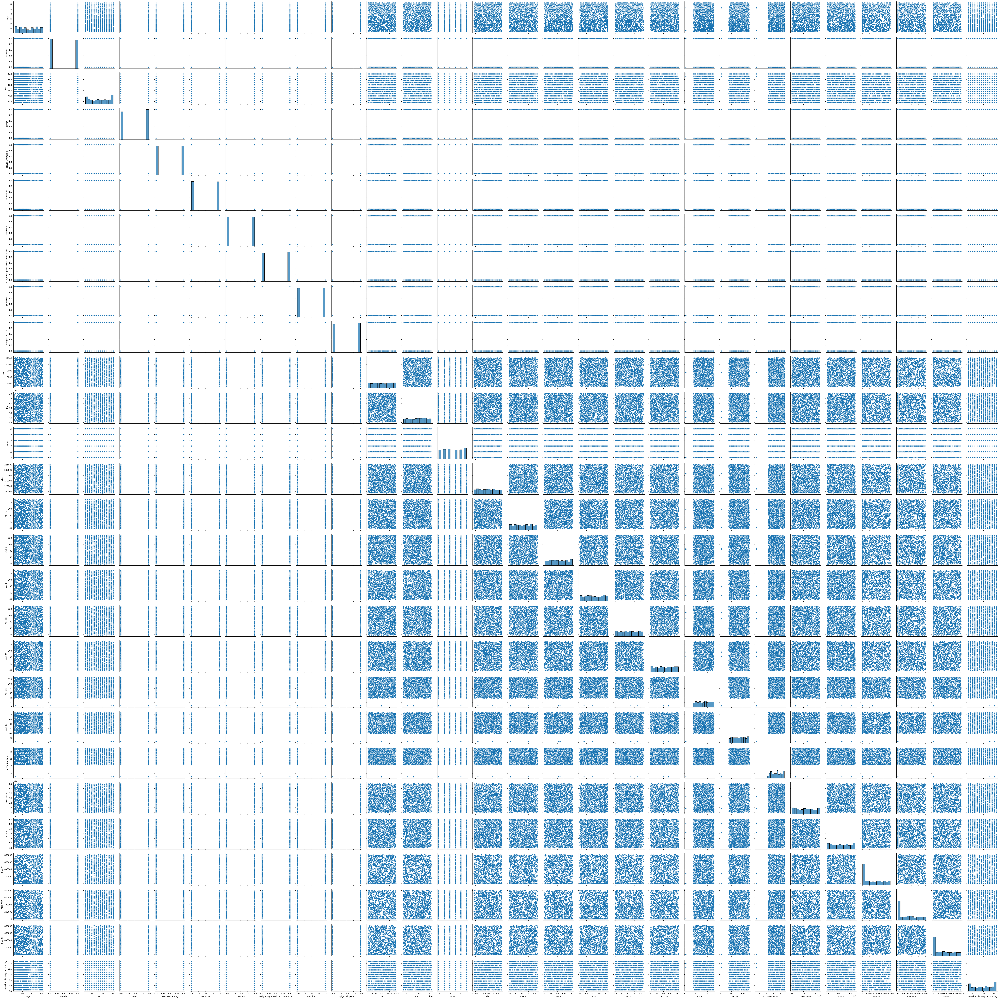

In [13]:
# Calculate the Z-scores
z_scores = (X - X.mean()) / X.std()

# Define a threshold for outlier detection
threshold = 3

# Find and remove outliers
outliers = (z_scores > threshold).any(axis=1)
X_cleaned = X[~outliers]
y_cleaned = y[~outliers]

# Check the new shape of the dataset after removing outliers
print("Shape of cleaned dataset:", X_cleaned.shape)

# Optional: Visualize the cleaned dataset
sns.pairplot(X_cleaned)
plt.show()

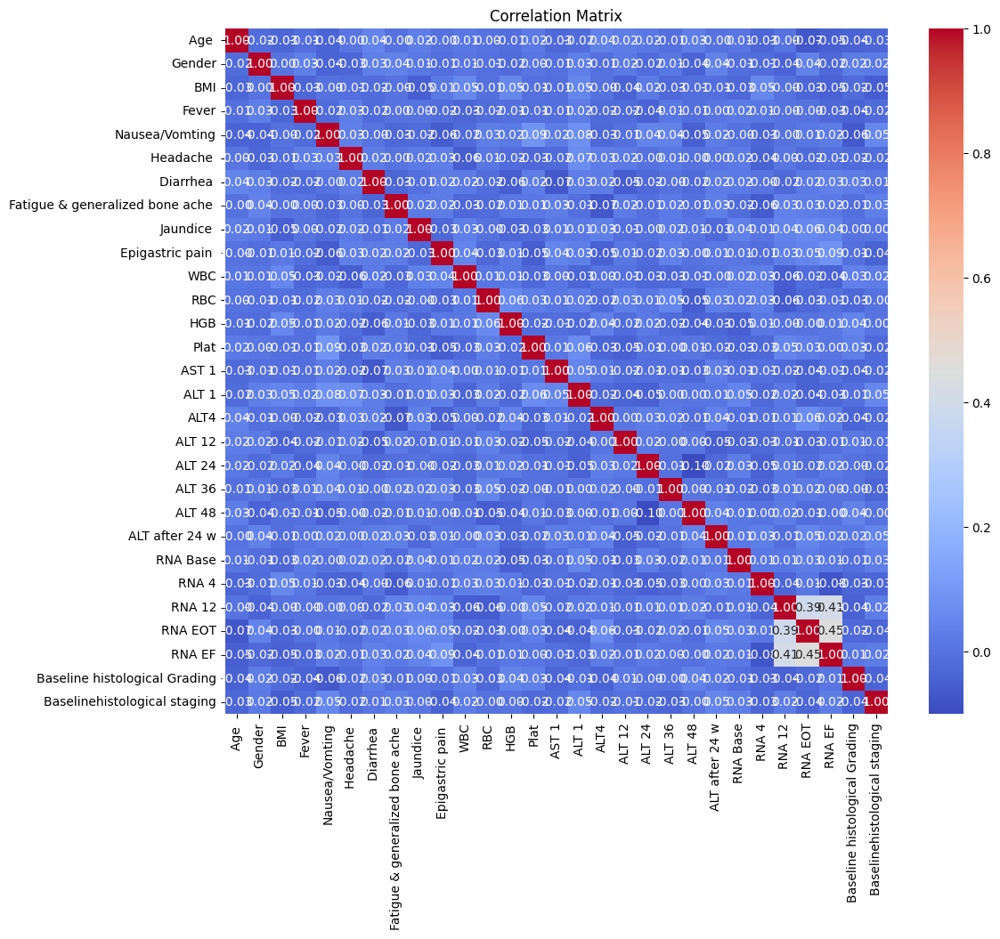

In [14]:
# Correlation Matrix Visualization
plt.figure(figsize=(12, 10))
sns.heatmap(data.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

In [15]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Normalize the features
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train_scaled)
X_test_normalized = scaler.transform(X_test_scaled)

X_train_scaled = X_train_normalized
X_test_scaled = X_test_normalized

In [16]:
# Define classifiers
classifiers = {
    "SVM": SVC(),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
}

# Define hyperparameters for each classifier
params = {
    "SVM": {"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]},
    "KNN": {"n_neighbors": [3, 5, 7]},
    "Decision Tree": {"max_depth": [3, 5, 7]},
    "Random Forest": {"n_estimators": [50, 100, 200]},
    "Gradient Boosting": {
        "n_estimators": [50, 100, 200],
        "learning_rate": [0.001, 0.0001],
    },
}

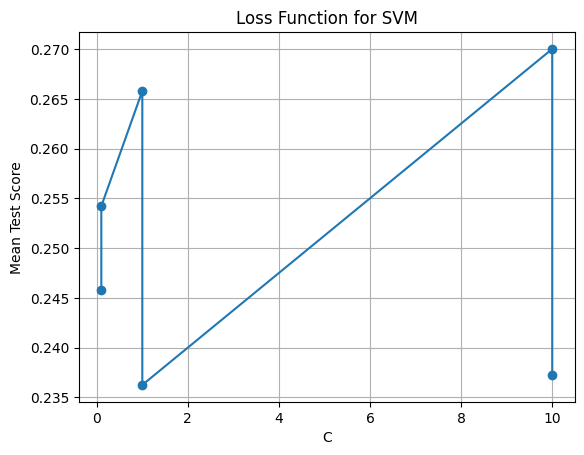

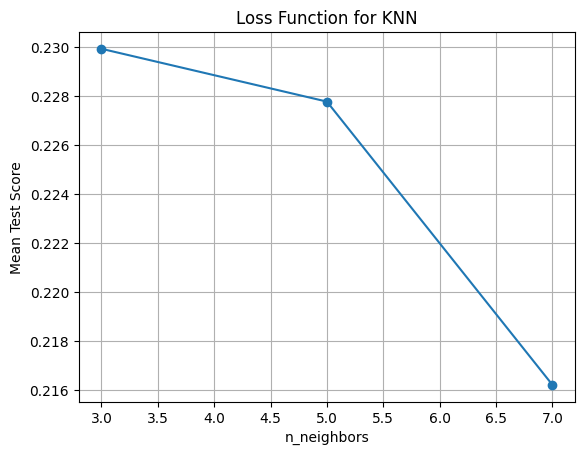

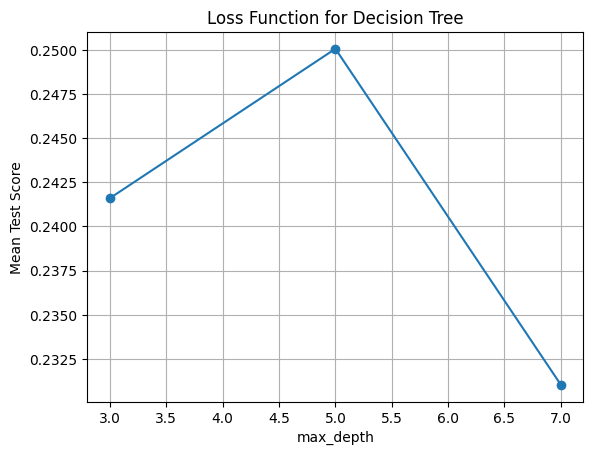

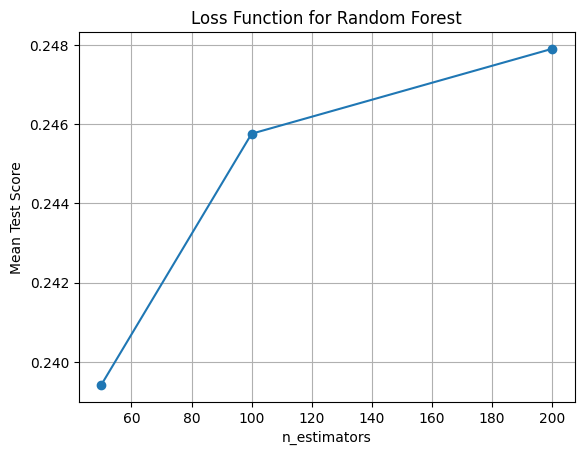

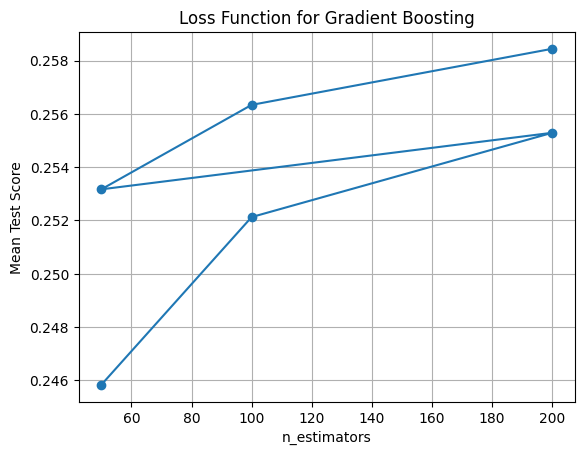

In [17]:
# GridSearchCV for hyperparameter tuning
results = {}
for name, clf in classifiers.items():
    grid_search = GridSearchCV(clf, params[name], cv=5, scoring="accuracy")
    grid_search.fit(X_train_scaled, y_train)
    best_clf = grid_search.best_estimator_

    # Fit the best classifier on the training data
    best_clf.fit(X_train_scaled, y_train)

    # Predictions on the test data
    y_pred = best_clf.predict(X_test_scaled)

    # Store results
    results[name] = {
        "best_params": grid_search.best_params_,
        "classification_report": classification_report(
            y_test, y_pred, output_dict=True
        ),
        "accuracy": accuracy_score(y_test, y_pred),
    }

    # Loss function plot
    plt.figure()
    plt.plot(
        grid_search.cv_results_["param_" + list(params[name].keys())[0]].data,
        grid_search.cv_results_["mean_test_score"],
        "-o",
    )
    plt.title(f"Loss Function for {name}")
    plt.xlabel(list(params[name].keys())[0])
    plt.ylabel("Mean Test Score")
    plt.grid(True)
    plt.show()

In [18]:
# Print classification report and accuracy for each classifier
for name, result in results.items():
    print(f"Best parameters for {name}: {result['best_params']}")
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred))
    print(f"Accuracy for {name}: {result['accuracy']}")

Best parameters for SVM: {'C': 10, 'kernel': 'linear'}
Classification Report for SVM:
              precision    recall  f1-score   support

           1       0.19      0.10      0.13        60
           2       0.33      0.07      0.11        58
           3       0.00      0.00      0.00        61
           4       0.24      0.79      0.37        58

    accuracy                           0.24       237
   macro avg       0.19      0.24      0.15       237
weighted avg       0.19      0.24      0.15       237

Accuracy for SVM: 0.23628691983122363
Best parameters for KNN: {'n_neighbors': 3}
Classification Report for KNN:
              precision    recall  f1-score   support

           1       0.19      0.10      0.13        60
           2       0.33      0.07      0.11        58
           3       0.00      0.00      0.00        61
           4       0.24      0.79      0.37        58

    accuracy                           0.24       237
   macro avg       0.19      0.24      0